In [1]:
import sys
sys.path.append('/home/maria/Documents/projects/anomaly_detection_vehicles')

### DRAEM

In [2]:
#configurations

train_image_path = '/home/maria/Documents/dataset_splited/agco_dataset/train/'
anomaly_source_path = '/home/maria/Documents/datasets/dtd/images/'
checkpoint_path = '/home/maria/Documents/projects/anomaly_detection_vehicles/checkpoints_carpet/'
run_name = 'FIELD_2'
resize_image = (224, 224*2)
batch_size = 1
lr = 0.0001
epochs = 100

### Dataloader

In [3]:
import torch

from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms

import torchvision
import matplotlib.pyplot as plt
import numpy as np


from torch.utils.data import DataLoader
from data.field_dataloader import CustomTrainDataset


#### Dataset After

In [ ]:
#dataset = CustomTrainDataset(image_dir=train_image_path, anomaly_source_dir=anomaly_source_path, resize_shape=resize_image)

#### Model - train

In [4]:
from models.DRAEM import ReconstructiveSubNetwork, DiscriminativeSubNetwork
from losses.loss import FocalLoss, SSIM
from torch import optim
import os

In [5]:
#lets test output,inout
model = ReconstructiveSubNetwork()  
input_image = torch.randn(1, 3, 224, 224*2)  
output_image = model(input_image)
print(output_image.shape)  

torch.Size([1, 3, 224, 448])


In [6]:
#lets test output,inout
model = DiscriminativeSubNetwork()  
input_image = torch.randn(1, 3, 224, 224*2)  
output_image = model(input_image)
print(output_image.shape)  

torch.Size([1, 3, 224, 448])


In [ ]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)


def save_images(images, titles, flags, n_iter, epoch, run_name, figsize=(10, 10)):
    output_dir = os.path.join(run_name, "visualisations", str(epoch))
    os.makedirs(output_dir, exist_ok=True)

    for i, (img, title, flag) in enumerate(zip(images, titles, flags)):
        plt.figure(figsize=figsize)
        
        img_np = img.detach().cpu().numpy().transpose(1, 2, 0)  # Convert (C, H, W) to (H, W, C)

        if flag is None:
            plt.imshow(np.clip(img_np, 0, 1))
        else:
            plt.imshow(np.clip(img_np, 0, 1), cmap=flag)

        plt.title(f"{title} (Iter {n_iter})")
        plt.axis("off")

        filename = os.path.join(output_dir, f"{n_iter}_{title.replace(' ', '_')}.png")
        plt.savefig(filename, bbox_inches='tight')
        plt.close()

    #print(f"images saved to {output_dir}")


def visualize_images(images, titles, n_iter, figsize=(15, 5)):

    plt.figure(figsize=figsize)
    num_images = len(images)

    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, num_images, i + 1)
        
        img_np = img.detach().cpu().numpy().transpose(1, 2, 0)  
        plt.imshow(np.clip(img_np, 0, 1))
        plt.title(f"{title} (Iter {n_iter})")
        plt.axis("off")

    plt.show()


In [8]:
model = ReconstructiveSubNetwork(in_channels=3, out_channels=3)
model.cuda()
model.apply(weights_init)

model_seg = DiscriminativeSubNetwork(in_channels=6, out_channels=2)
model_seg.cuda()
model_seg.apply(weights_init)

RuntimeError: No CUDA GPUs are available

In [9]:
model = ReconstructiveSubNetwork(in_channels=3, out_channels=3)
#model.apply(weights_init)
model.load_state_dict(torch.load("/home/maria/Documents/projects/anomaly_detection_vehicles/checkpoints/TEST_FIELD_1_.pckl"))

#model.load_state_dict(torch.load("/home/maria/Documents/projects/anomaly_detection_vehicles/checkpoints/DRAEM_seg_large_ae_large_0.0001_800_bs8_carpet_.pckl"))
model.cuda()
#model.eval()

model_seg = DiscriminativeSubNetwork(in_channels=6, out_channels=2)
#model_seg.load_state_dict(torch.load("/home/maria/Documents/projects/anomaly_detection_vehicles/checkpoints/DRAEM_seg_large_ae_large_0.0001_800_bs8_carpet__seg.pckl"))
model_seg.load_state_dict(torch.load("/home/maria/Documents/projects/anomaly_detection_vehicles/checkpoints/TEST_FIELD_1__seg.pckl"))

model_seg.cuda()

RuntimeError: Attempting to deserialize object on a CUDA device but torch.cuda.is_available() is False. If you are running on a CPU-only machine, please use torch.load with map_location=torch.device('cpu') to map your storages to the CPU.

In [15]:
# python train_DRAEM.py --gpu_id 0 --obj_id -1 --lr 0.0001 --bs 8 --epochs 700 --data_path ./datasets/mvtec/ --anomaly_source_path ./datasets/dtd/images/ --checkpoint_path ./checkpoints/ --log_path ./logs/
optimizer = torch.optim.Adam([
                                {"params": model.parameters(), "lr": lr},
                                {"params": model_seg.parameters(), "lr": lr}])

scheduler = optim.lr_scheduler.MultiStepLR(optimizer,[epochs*0.8, epochs*0.9],gamma=0.2, last_epoch=-1)

loss_l2 = torch.nn.modules.loss.MSELoss()
loss_ssim = SSIM()
loss_focal = FocalLoss()

In [16]:
dataset = CustomTrainDataset(image_dir=train_image_path, anomaly_source_dir=anomaly_source_path, resize_shape=resize_image)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=6)

In [17]:
len(dataloader)

2020

Epoch: 0


Image 0 - L2 Loss: 0.0306 | SSIM Loss: 0.7368 | Segment Loss: 0.0741 | Total Loss: 0.8415


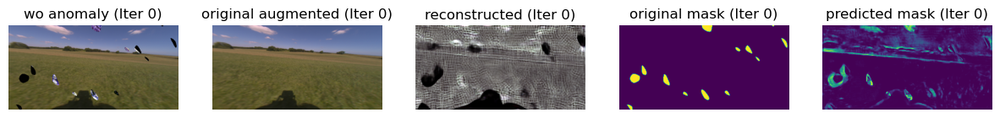

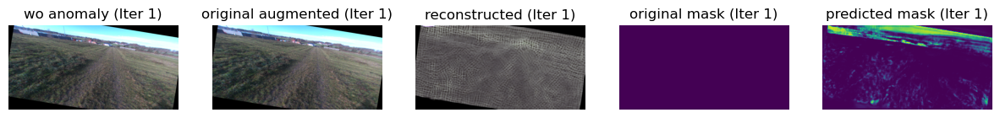

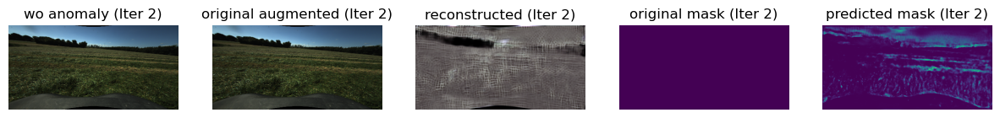

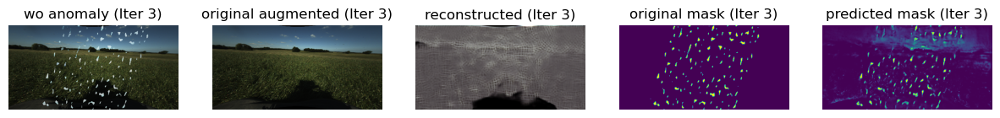

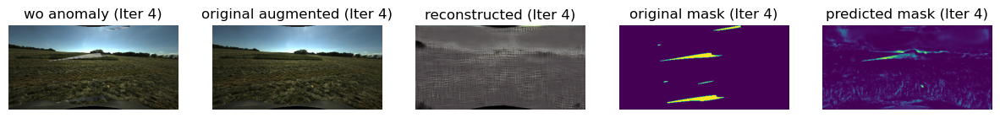

...

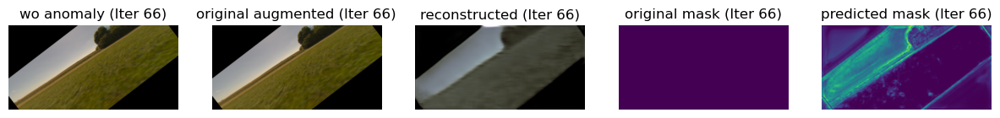

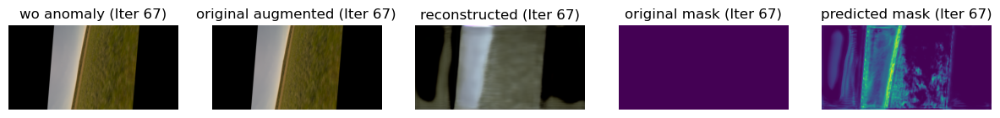

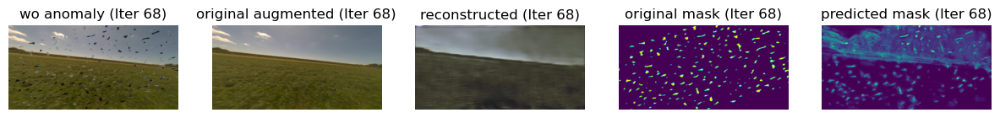

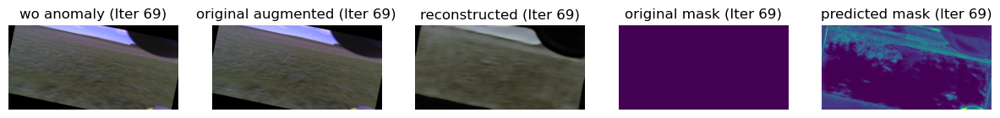

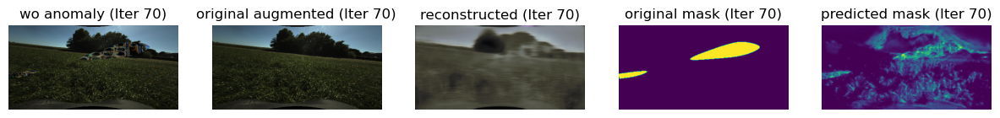

In [ ]:
import json

loss_history = []

n_iter = 0
for epoch in range(epochs):
    print("Epoch: " + str(epoch))
    for i_batch, sample_batched in enumerate(dataloader):
        gray_batch = sample_batched["image"].cuda()
        aug_gray_batch = sample_batched["augmented_image"].cuda()
        anomaly_mask = sample_batched["anomaly_mask"].cuda()

        gray_rec = model(aug_gray_batch)
        joined_in = torch.cat((gray_rec, aug_gray_batch), dim=1)

        out_mask = model_seg(joined_in)
        out_mask_sm = torch.softmax(out_mask, dim=1)

        l2_loss = loss_l2(gray_rec, gray_batch)
        ssim_loss = loss_ssim(gray_rec, gray_batch)

        segment_loss = loss_focal(out_mask_sm, anomaly_mask)
        loss = l2_loss + ssim_loss + segment_loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Store the losses in the list
        loss_entry = {
            'iteration': n_iter,
            'epoch': epoch,
            'l2_loss': l2_loss.item(),
            'ssim_loss': ssim_loss.item(),
            'segment_loss': segment_loss.item(),
            'total_loss': loss.item()
        }
        loss_history.append(loss_entry)

        
        #if n_iter == 0 or n_iter == 2020:
        #    print(f"Image {n_iter} - L2 Loss: {l2_loss.item():.4f} | SSIM Loss: {ssim_loss.item():.4f} | Segment Loss: {segment_loss.item():.4f} | Total Loss: {loss.item():.4f}")

        # Visualize images
        if n_iter%200 == 0 or n_iter==2019:
            images = [aug_gray_batch[0], gray_batch[0], gray_rec[0], anomaly_mask[0], out_mask_sm[:, 1:, :, :][0]]
            titles = ["wo anomaly", "original augmented", "reconstructed", "original mask", "predicted mask"]
            flags = [None, None, None, 'grey', None]
            run_name = run_name

            save_images(images, titles, flags, n_iter, epoch, run_name)

        # Visualize images
        t_mask = out_mask_sm[:, 1:, :, :]

        visualize_images(
            images=[aug_gray_batch[0], gray_batch[0], gray_rec[0], anomaly_mask[0], t_mask[0]],
            titles=["wo anomaly", "original augmented", "reconstructed", "original mask", "predicted mask"],
            n_iter=n_iter
        )

        n_iter +=1

    scheduler.step()

    # save checkpoints
    torch.save(model.state_dict(), os.path.join(checkpoint_path, run_name + ".pckl"))
    torch.save(model_seg.state_dict(), os.path.join(checkpoint_path, run_name + "_seg.pckl"))

# save the loss history
#loss_file_path = os.path.join(checkpoint_path, run_name + "_loss_history.json")
#with open(loss_file_path, 'w') as f:
#    json.dump(loss_history, f, indent=4)